# Setting up the environment

In [1]:
!pip install -q -U tensorflow-hub tensorflow-text tensorflow-addons

In [2]:
import os
import numpy as np
import tensorflow as tf
import pandas as pd
from collections import namedtuple
import cv2
from tqdm import tqdm
import random
import six
import time
import albumentations as A
from tensorflow.keras import layers
import tensorflow_addons as tfa
from tensorflow.python.training import moving_averages
from google.colab.patches import cv2_imshow
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
from tensorflow.keras.utils import plot_model

In [3]:
!nvidia-smi

Wed May 12 15:09:31 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P0    57W / 300W |      0MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Untaring Jester dataset

In [4]:
dataset_directory = '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data'
content_dir = '/content'

In [5]:
l = os.listdir(dataset_directory)
nl = []
for s in l:
    if s.startswith('20'):
        nl.append(os.path.join(dataset_directory, s))
nl = sorted(nl)
nl

['/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1',
 '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1-00',
 '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1-01',
 '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1-02',
 '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1-03',
 '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1-04',
 '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1-05',
 '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1-06',
 '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1-07',
 '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v

In [6]:
for s in tqdm(nl):
    !cp "$s" "$content_dir"

  0%|          | 0/24 [00:00<?, ?it/s]

cp: -r not specified; omitting directory '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1'


100%|██████████| 24/24 [09:27<00:00, 23.66s/it]


In [7]:
!cat 20bn-jester-v1-??  | tar zx 

In [8]:
len(os.listdir('/content/20bn-jester-v1'))

148092

#Detector(one hot)

##Config

In [ ]:
data_dir = '/content/20bn-jester-v1'
#data_dir = '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1'
num_frames = 32
resized_shape = (112, 112)
rescale = True
class_weights = {0:4.29037489628121, 1:0.5659565364484865}
detector_name = '3D-resnet-10'
detector_input_shape = (num_frames, resized_shape[0], resized_shape[1], 3)
batch_size = 128

In [ ]:
len(os.listdir(data_dir))

148092

## Exploring data

### Reading CSVs

In [ ]:
selected_gestures

{'Doing other things',
 'Drumming Fingers',
 'No gesture',
 'Pulling Hand In',
 'Pulling Two Fingers In',
 'Pushing Hand Away',
 'Pushing Two Fingers Away',
 'Rolling Hand Backward',
 'Rolling Hand Forward',
 'Shaking Hand',
 'Sliding Two Fingers Down',
 'Sliding Two Fingers Left',
 'Sliding Two Fingers Right',
 'Sliding Two Fingers Up',
 'Stop Sign',
 'Swiping Down',
 'Swiping Left',
 'Swiping Right',
 'Swiping Up',
 'Thumb Down',
 'Thumb Up',
 'Turning Hand Clockwise',
 'Turning Hand Counterclockwise',
 'Zooming In With Full Hand',
 'Zooming In With Two Fingers',
 'Zooming Out With Full Hand',
 'Zooming Out With Two Fingers'}

In [ ]:
df_train = pd.read_csv('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester CSVs/jester-v1-train.csv', delimiter=';', header=None)
df_test = pd.read_csv('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester CSVs/jester-v1-test.csv', delimiter=';', header=None)
df_val = pd.read_csv('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester CSVs/jester-v1-validation.csv', delimiter=';', header=None)
df_labels = pd.read_csv('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester CSVs/jester-v1-labels.csv', delimiter=';', header=None)

all_classes = []
for i, j in df_labels.iterrows():
    all_classes.append(j.item())

#selected_gestures = set(['Swiping Left', 'Swiping Right', 'Swiping Down', 'Swiping Up', 'Stop Sign', 'No gesture'])
#selected_gestures = set(['Stop Sign', 'No gesture'])
selected_gestures = set(all_classes)

train_csv = df_train.to_dict(orient='split')['data']
train_data = {selected_label : [] for selected_label in selected_gestures}
for data in train_csv:
    if data[1] in selected_gestures:
        if data[1] == 'No gesture' or data[1] == 'Doing other things': 
            label = 0.0
        else : label = 1.0
        path = os.path.join(data_dir, str(data[0]))
        try:
            if len(os.listdir(path)) >= num_frames:
                train_data[data[1]].append([path, label])
        except : pass
validation_csv = df_val.to_dict(orient='split')['data']
val_data = {selected_label : [] for selected_label in selected_gestures}
for data in validation_csv:
    if data[1] in selected_gestures:
        if data[1] == 'No gesture' or data[1] == 'Doing other things': 
            label = 0.0
        else : label = 1.0
        path = os.path.join(data_dir, str(data[0]))
        try:
            if len(os.listdir(path)) >= num_frames:
                val_data[data[1]].append([path, label])
        except: pass

### Extracting Dataset

In [ ]:
def find_len(data):
    len_data = 0
    for key in data:
        len_data += len(data[key])
    return len_data
train_total = find_len(train_data)
val_total = find_len(val_data)

In [ ]:
neg = len(train_data['No gesture']) + len(train_data['Doing other things'])
pos = train_total - neg
weight_for_0 = (1 / neg)*(train_total)/2.0 
weight_for_1 = (1 / pos)*(train_total)/2.0

In [ ]:
train_total, val_total, neg, pos

(113755, 14501, 13257, 100498)

In [ ]:
#class_weights = (weight_for_0, weight_for_1)

In [ ]:
def show_vid(path = None, frames = None):
    if frames == None:
        path = os.path.join(data_dir, str(path))
        frames = sorted(os.listdir(path))
    for frame in frames:
        if path != None:
            frame = os.path.join(path, frame)
            frame = cv2.imread(frame)
            cv2_imshow(frame)
        else:
            cv2_imshow(np.array(frame) * 255.)

In [ ]:
def fn_read_frame(rescale):
    def read_frame(frame):
        frame = cv2.imread(frame)
        frame = cv2.resize(frame, resized_shape)
        if rescale: frame = frame/255.
        return frame
    return read_frame

In [ ]:
f  = ['/content/20bn-jester-v1/69102/00003.jpg', '/content/20bn-jester-v1/69102/00004.jpg', '/content/20bn-jester-v1/69102/00005.jpg', '/content/20bn-jester-v1/69102/00006.jpg', '/content/20bn-jester-v1/69102/00007.jpg', '/content/20bn-jester-v1/69102/00008.jpg', '/content/20bn-jester-v1/69102/00009.jpg', '/content/20bn-jester-v1/69102/00010.jpg', '/content/20bn-jester-v1/69102/00011.jpg', '/content/20bn-jester-v1/69102/00012.jpg', '/content/20bn-jester-v1/69102/00013.jpg', '/content/20bn-jester-v1/69102/00014.jpg', '/content/20bn-jester-v1/69102/00015.jpg', '/content/20bn-jester-v1/69102/00016.jpg', '/content/20bn-jester-v1/69102/00017.jpg', '/content/20bn-jester-v1/69102/00018.jpg', '/content/20bn-jester-v1/69102/00019.jpg', '/content/20bn-jester-v1/69102/00020.jpg', '/content/20bn-jester-v1/69102/00021.jpg', '/content/20bn-jester-v1/69102/00022.jpg', '/content/20bn-jester-v1/69102/00023.jpg', '/content/20bn-jester-v1/69102/00024.jpg', '/content/20bn-jester-v1/69102/00025.jpg', '/content/20bn-jester-v1/69102/00026.jpg', '/content/20bn-jester-v1/69102/00027.jpg', '/content/20bn-jester-v1/69102/00028.jpg', '/content/20bn-jester-v1/69102/00029.jpg', '/content/20bn-jester-v1/69102/00030.jpg', '/content/20bn-jester-v1/69102/00031.jpg', '/content/20bn-jester-v1/69102/00032.jpg', '/content/20bn-jester-v1/69102/00033.jpg', '/content/20bn-jester-v1/69102/00034.jpg']
read_frame = fn_read_frame(rescale)
frames = np.array(list(map(read_frame, f))) 

In [ ]:
frames.shape

(32, 112, 112, 3)

In [ ]:
def extract_frames(path, label, num_frames = num_frames, resized_shape = resized_shape, rescale = True):
    """
    path --> path to video directory with all the frames
    output : num_frames which are resized and rescaled if rescaled == True
    """
    frames = [os.path.join(path, frame) for frame in sorted(os.listdir(path))]

    n_frames = len(frames)
    if n_frames != num_frames:
        odd = n_frames % 2
        remove_n_frames = (n_frames - num_frames) // 2
        frames = frames[remove_n_frames : - (remove_n_frames + odd)]

    read_frame = fn_read_frame(rescale)
    frames = np.array(list(map(read_frame, frames)))  
    
    if frames.shape == (0,): 
        print(path)
    
    oh_label = tf.one_hot(int(label), depth = 2, dtype=tf.float32)
    sample_weight = class_weights[label]
    return (frames, oh_label, sample_weight)

In [ ]:
val_data['Doing other things']

In [ ]:
frames, label, sample_weight = extract_frames(val_data['Doing other things'][0][0], val_data['Doing other things'][0][1])

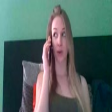

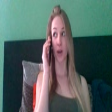

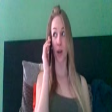

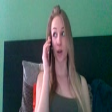

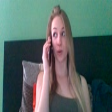

...

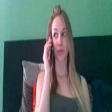

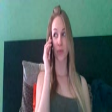

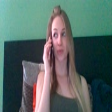

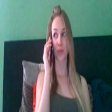

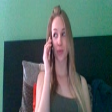

In [ ]:
show_vid(frames = frames.tolist())

### tf.data.Dataset

In [ ]:
def get_dataset(data):
    image_paths, labels = [], []
    for key in data:
        for path, label in data[key]:
            image_paths.append(path)
            labels.append(label)
    image_paths, labels = shuffle(image_paths, labels)
    return tf.data.Dataset.from_tensor_slices((image_paths, labels))

In [ ]:
def extract_data(path, label):
    def f(path, label):
        #frames, label, weights = extract_frames(path.decode(), label)
        #return (frames, label, weights)
        frames, label, sample_weight = extract_frames(path.decode(), label)
        return (frames, label, sample_weight)
    return tf.numpy_function(f, [path, label], [tf.float64, tf.float32,  tf.float64])

In [ ]:
train_ds = get_dataset(train_data)
train_ds = train_ds.map(extract_data)

train_ds = train_ds.batch(batch_size)
train_ds = train_ds.prefetch(3)

In [ ]:
val_ds = get_dataset(val_data)
val_ds = val_ds.map(extract_data)

val_ds = val_ds.batch(batch_size)
val_ds = val_ds.prefetch(3) 

In [ ]:
i = 0
for x, y, z in train_ds:
    
    print(x.shape)
    print(y[0])
    print(z.shape)
    print('sample weight for y[0] = ', z[0].numpy())
    break

(128, 32, 112, 112, 3)
tf.Tensor([0. 1.], shape=(2,), dtype=float32)
(128,)
sample weight for y[0] =  0.5659565364484865


## Resnet-10 Model

### Design Model

In [ ]:
def conv_block(inputs, F, stage, strides = (2,2,2)):
    base_name = f'conv_{stage}'
    bn_axis = 4

    x = layers.Conv3D(F, (1, 1, 1), strides = strides,
                        kernel_initializer='he_normal')(inputs)
    x = layers.BatchNormalization(axis=bn_axis)(x)
    x = layers.Activation('relu')(x)
    
    x = layers.Conv3D(F, kernel_size=(3, 3, 3), padding = 'same',
                        kernel_initializer = 'he_normal', 
                        name = base_name + '_1')(x)
    x = layers.BatchNormalization(axis=bn_axis)(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv3D(F, kernel_size=(3, 3, 3), padding = 'same',
                        kernel_initializer = 'he_normal', 
                        name = base_name + '_2')(x)
    x = layers.BatchNormalization(axis=bn_axis)(x)
    x = layers.Activation('relu')(x)

    shortcut = layers.Conv3D(F, (1, 1, 1), strides = strides,
                            kernel_initializer='he_normal')(inputs)
                             
    x = layers.add([x, shortcut])
    x = layers.Activation('relu')(x)

    return x
        

def build_model(input_dims, F, model_name):
    input_layer = layers.Input(shape=input_dims)
    x = layers.Conv3D(F, (3,3,7), strides = (1, 2, 2),
                            padding='same',
                            name = 'conv1')(input_layer)
    x = layers.BatchNormalization(axis=4)(x)
    x = layers.Activation('relu')(x)
        
    x = layers.MaxPool3D(pool_size=(3,3,3), strides=(2,2,2), 
                            name = 'pool1')(x)

    #x = conv_block(x, F, stage = 2)
    x = conv_block(x, F * 2, stage = 2)
    x = conv_block(x, F * 4, stage = 3)
    x = conv_block(x, F * 8, stage = 4)

    x = layers.GlobalAveragePooling3D()(x)
    pred = layers.Dense(units = 2, activation='softmax')(x)

    return tf.keras.Model(input_layer, pred, name = model_name)


In [ ]:
resnet10 = build_model(detector_input_shape, 16, detector_name)

In [ ]:
resnet10.summary()

Model: "3D-resnet-10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 112, 112 0                                            
__________________________________________________________________________________________________
conv1 (Conv3D)                  (None, 32, 56, 56, 1 3040        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 32, 56, 56, 1 64          conv1[0][0]                      
__________________________________________________________________________________________________
activation (Activation)         (None, 32, 56, 56, 1 0           batch_normalization[0][0]        
_______________________________________________________________________________________

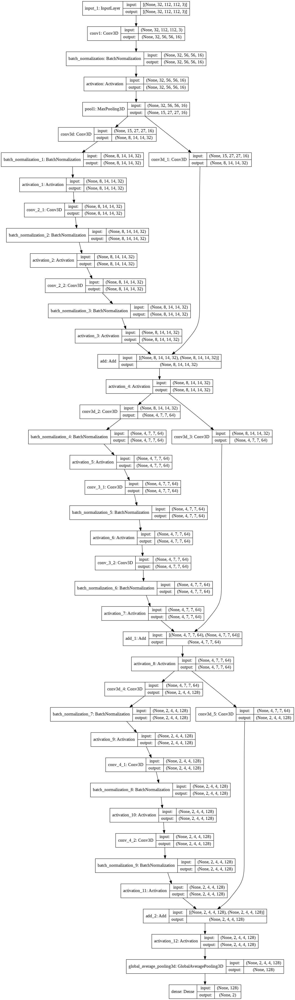

In [ ]:
plot_model(resnet10, show_shapes=True)

### Train Model

In [ ]:
resnet10.compile(
    optimizer=tfa.optimizers.AdamW(learning_rate=0.001, weight_decay=0.001),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy'])

In [ ]:
# Create a learning rate scheduler callback.
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_accuracy", factor=0.2, patience=1, verbose = 1
)
# Create an early stopping callback.
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy", patience=3, restore_best_weights=False
)

model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath = '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/MFF_Models/resnet10v2.h5',
     monitor = 'val_accuracy', verbose = 1, save_weights_only = True, save_best_only = True
)

In [ ]:
num_epochs = 3

train_ds = get_dataset(train_data)
train_ds = train_ds.map(extract_data)
train_ds = train_ds.batch(batch_size)
train_ds = train_ds.prefetch(3)

val_ds = get_dataset(val_data)
val_ds = val_ds.map(extract_data)
val_ds = val_ds.batch(batch_size)
val_ds = val_ds.prefetch(3) 

callbacks = [reduce_lr, early_stopping, model_checkpoint]


In [ ]:
for x, y, z in val_ds:
    print(resnet10(x))
    break

tf.Tensor(
[[0.7182691  0.2817309 ]
 [0.6496074  0.35039258]
 [0.7240482  0.2759518 ]
 [0.68622994 0.3137701 ]
 [0.66414076 0.33585927]
 [0.67391187 0.32608813]
 [0.74749845 0.25250152]
 [0.69653696 0.303463  ]
 [0.69042647 0.3095735 ]
 [0.6777994  0.32220057]
 [0.6891351  0.31086487]
 [0.6050373  0.39496276]
 [0.55424935 0.44575062]
 [0.64029324 0.35970676]
 [0.68151337 0.31848666]
 [0.68582195 0.31417805]
 [0.6859201  0.3140799 ]
 [0.6421069  0.35789308]
 [0.67156637 0.32843366]
 [0.65606874 0.3439313 ]
 [0.5742984  0.42570162]
 [0.6615999  0.33840013]
 [0.6805351  0.31946492]
 [0.68553454 0.3144654 ]
 [0.677      0.323     ]
 [0.68436867 0.31563127]
 [0.646576   0.35342398]
 [0.6756464  0.32435358]
 [0.7002799  0.29972008]
 [0.6031644  0.39683563]
 [0.6713949  0.3286051 ]
 [0.6547805  0.3452195 ]
 [0.7401494  0.2598506 ]
 [0.6681987  0.33180127]
 [0.6240954  0.37590468]
 [0.6974242  0.30257583]
 [0.6770002  0.32299978]
 [0.6834893  0.3165107 ]
 [0.6459316  0.35406843]
 [0.6719307  0

In [ ]:
resnet10.load_weights('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/MFF_Models/resnet10.h5')

In [ ]:
tf.config.run_functions_eagerly(True)
history = resnet10.fit( 
    train_ds,
    epochs=num_epochs,
    validation_data=val_ds,
    callbacks=callbacks,
    
)

In [ ]:
resnet10.save('3d-resnet-10')

INFO:tensorflow:Assets written to: 3d-resnet-10/assets


In [ ]:
resnet10.evaluate(val_ds)

114/114 [==============================] - 537s 5s/step - loss: 0.5091 - accuracy: 0.6308


[0.5091056227684021, 0.6307840943336487]

In [ ]:
!cp -r '/content/3d-resnet-10' '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/MFF_Models/'

In [ ]:
history

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])


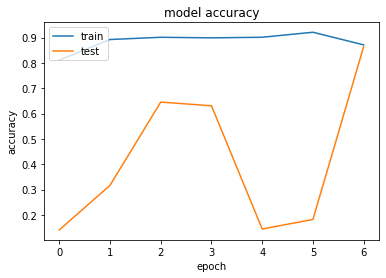

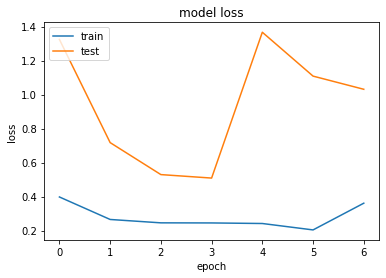

In [ ]:
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Eval

In [ ]:
def show_pred(n = 1):
    n = [n ,n, n, n]
    c1, c2, c3, c4 = 0, 0, 0, 0
    val_ds = get_dataset(val_data)
    val_ds = val_ds.map(extract_data)
    val_ds = val_ds.batch(8)
 
    for data in val_ds:
        pred = resnet10.predict(data[0])
        for i, (x, y, z) in enumerate(zip(data[0], data[1], data[2])):
            label = np.argmax(y)
            if np.argmax(pred[i]) == label:
                c1 += 1
                if label == 0 and n[0] != 0:
                    print('showing correctly predicted....')
                    print(f"No gesture or Doing other things Example number : {n[0]}")
                    print()
                    print()
                    
                    #show_vid(frames = x.numpy().tolist())
                    n[0] -= 1

                elif label == 1 and n[1] != 0: 
                    print('showing correctly predicted....')
                    print(f"Gesture example : {n[1]}")
                    print()
                    print()
                    #show_vid(frames = x.numpy().tolist())
                    
                    n[1] -= 1
            else:
                c2 += 1
                if label == 0 and n[2] != 0:
                    print('showing wrongly predicted....')
                    print(f"No gesture or Doing other things Example : {n[2]}")
                    print()
                    print()
                    #show_vid(frames = x.numpy().tolist())
                    
                    n[2] -= 1

                elif label == 1 and n[3] != 0: 
                    print('showing wrongly predicted....')
                    print(f"Gesture example : {n[3]}")
                    print()
                    print()
                    #show_vid(frames = x.numpy().tolist())
                    
                    n[3] -= 1
        
        if n == [0, 0 ,0 ,0]:
            print(c1)
            print(c2)
            break


In [ ]:
show_pred(10)

showing correctly predicted....
No gesture or Doing other things Example number : 10


showing correctly predicted....
No gesture or Doing other things Example number : 9


showing correctly predicted....
Gesture example : 10


showing correctly predicted....
Gesture example : 9


showing correctly predicted....
Gesture example : 8


showing correctly predicted....
Gesture example : 7


showing wrongly predicted....
Gesture example : 10


showing correctly predicted....
Gesture example : 6


showing correctly predicted....
Gesture example : 5


showing correctly predicted....
Gesture example : 4


showing correctly predicted....
Gesture example : 3


showing correctly predicted....
No gesture or Doing other things Example number : 8


showing wrongly predicted....
Gesture example : 9


showing correctly predicted....
Gesture example : 2


showing correctly predicted....
Gesture example : 1


showing wrongly predicted....
Gesture example : 8


showing wrongly predicted....
Gesture examp

#Detector(Binary-Classifier)

##Config

In [ ]:
data_dir = '/content/20bn-jester-v1'
#data_dir = '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1'
num_frames = 32
resized_shape = (112, 112)
rescale = True
class_weights = {0:4.29037489628121, 1:0.5659565364484865}
detector_name = '3D-resnet-10'
detector_input_shape = (num_frames, resized_shape[0], resized_shape[1], 3)
batch_size = 128

In [ ]:
len(os.listdir(data_dir))

148092

## Exploring data

### Reading CSVs

In [ ]:
df_train = pd.read_csv('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester CSVs/jester-v1-train.csv', delimiter=';', header=None)
df_test = pd.read_csv('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester CSVs/jester-v1-test.csv', delimiter=';', header=None)
df_val = pd.read_csv('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester CSVs/jester-v1-validation.csv', delimiter=';', header=None)
df_labels = pd.read_csv('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester CSVs/jester-v1-labels.csv', delimiter=';', header=None)

all_classes = []
for i, j in df_labels.iterrows():
    all_classes.append(j.item())

selected_gestures = set(['Swiping Left', 'Swiping Right', 'Swiping Down', 'Swiping Up', 'Stop Sign', 'No gesture', 'Doing other things'])
#selected_gestures = set(['Stop Sign', 'No gesture'])
#selected_gestures = set(all_classes)

train_csv = df_train.to_dict(orient='split')['data']
train_data = {selected_label : [] for selected_label in selected_gestures}
for data in train_csv:
    if data[1] in selected_gestures:
        if data[1] == 'No gesture' or data[1] == 'Doing other things': 
            label = 0.0
        else : label = 1.0
        path = os.path.join(data_dir, str(data[0]))
        train_data[data[1]].append([path, label])

validation_csv = df_val.to_dict(orient='split')['data']
val_data = {selected_label : [] for selected_label in selected_gestures}
for data in validation_csv:
    if data[1] in selected_gestures:
        if data[1] == 'No gesture' or data[1] == 'Doing other things': 
            label = 0.0
        else : label = 1.0
        path = os.path.join(data_dir, str(data[0]))
        val_data[data[1]].append([path, label])

NameError: ignored

### Extracting Dataset

In [ ]:
def find_len(data):
    len_data = 0
    for key in data:
        len_data += len(data[key])
    return len_data
train_total = find_len(train_data)
val_total = find_len(val_data)

In [ ]:
neg = len(train_data['No gesture']) + len(train_data['Doing other things'])
pos = train_total - neg
weight_for_0 = (1 / neg)*(train_total)/2.0 
weight_for_1 = (1 / pos)*(train_total)/2.0

In [ ]:
train_total, val_total, neg, pos

(113755, 14501, 13257, 100498)

In [ ]:
#class_weights = (weight_for_0, weight_for_1)

In [ ]:
def show_vid(path = None, frames = None):
    if frames == None:
        path = os.path.join(data_dir, str(path))
        frames = sorted(os.listdir(path))
    for frame in frames:
        if path != None:
            frame = os.path.join(path, frame)
            frame = cv2.imread(frame)
            cv2_imshow(frame)
        else:
            cv2_imshow(np.array(frame) * 255.)

In [ ]:
def fn_read_frame(rescale):
    def read_frame(frame):
        frame = cv2.imread(frame)
        frame = cv2.resize(frame, resized_shape)
        if rescale: frame = frame/255.
        return frame
    return read_frame

In [ ]:
f  = ['/content/20bn-jester-v1/69102/00003.jpg', '/content/20bn-jester-v1/69102/00004.jpg', '/content/20bn-jester-v1/69102/00005.jpg', '/content/20bn-jester-v1/69102/00006.jpg', '/content/20bn-jester-v1/69102/00007.jpg', '/content/20bn-jester-v1/69102/00008.jpg', '/content/20bn-jester-v1/69102/00009.jpg', '/content/20bn-jester-v1/69102/00010.jpg', '/content/20bn-jester-v1/69102/00011.jpg', '/content/20bn-jester-v1/69102/00012.jpg', '/content/20bn-jester-v1/69102/00013.jpg', '/content/20bn-jester-v1/69102/00014.jpg', '/content/20bn-jester-v1/69102/00015.jpg', '/content/20bn-jester-v1/69102/00016.jpg', '/content/20bn-jester-v1/69102/00017.jpg', '/content/20bn-jester-v1/69102/00018.jpg', '/content/20bn-jester-v1/69102/00019.jpg', '/content/20bn-jester-v1/69102/00020.jpg', '/content/20bn-jester-v1/69102/00021.jpg', '/content/20bn-jester-v1/69102/00022.jpg', '/content/20bn-jester-v1/69102/00023.jpg', '/content/20bn-jester-v1/69102/00024.jpg', '/content/20bn-jester-v1/69102/00025.jpg', '/content/20bn-jester-v1/69102/00026.jpg', '/content/20bn-jester-v1/69102/00027.jpg', '/content/20bn-jester-v1/69102/00028.jpg', '/content/20bn-jester-v1/69102/00029.jpg', '/content/20bn-jester-v1/69102/00030.jpg', '/content/20bn-jester-v1/69102/00031.jpg', '/content/20bn-jester-v1/69102/00032.jpg', '/content/20bn-jester-v1/69102/00033.jpg', '/content/20bn-jester-v1/69102/00034.jpg']
read_frame = fn_read_frame(rescale)
frames = np.array(list(map(read_frame, f))) 

In [ ]:
frames.shape

(32, 112, 112, 3)

In [ ]:
def extract_frames(path, label, num_frames = num_frames, resized_shape = resized_shape, rescale = True):
    """
    path --> path to video directory with all the frames
    output : num_frames which are resized and rescaled if rescaled == True
    """
    frames = [os.path.join(path, frame) for frame in sorted(os.listdir(path))]

    n_frames = len(frames)
    if n_frames != num_frames:
        odd = n_frames % 2
        remove_n_frames = (n_frames - num_frames) // 2
        frames = frames[remove_n_frames : - (remove_n_frames + odd)]

    read_frame = fn_read_frame(rescale)
    frames = np.array(list(map(read_frame, frames)))  
    
    if frames.shape == (0,): 
        print(path)
    
    #oh_label = tf.one_hot(int(label), depth = 2, dtype=tf.float32)
    sample_weight = class_weights[label]
    return (frames, label, sample_weight)

In [ ]:
frames, label, sample_weight = extract_frames(val_data['Doing other things'][0][0], val_data['Doing other things'][0][1])

NameError: ignored

In [ ]:
show_vid(frames = frames.tolist())

### tf.data.Dataset

In [ ]:
def get_dataset(data):
    image_paths, labels = [], []
    for key in data:
        for path, label in data[key]:
            image_paths.append(path)
            labels.append(label)
    image_paths, labels = shuffle(image_paths, labels)
    return tf.data.Dataset.from_tensor_slices((image_paths, labels))

In [ ]:
def extract_data(path, label):
    def f(path, label):
        #frames, label, weights = extract_frames(path.decode(), label)
        #return (frames, label, weights)
        frames, label, sample_weight = extract_frames(path.decode(), label)
        return (frames, label, sample_weight)
    return tf.numpy_function(f, [path, label], [tf.float64, tf.float32,  tf.float64])

In [ ]:
train_ds = get_dataset(train_data)
train_ds = train_ds.map(extract_data)

train_ds = train_ds.batch(batch_size)
train_ds = train_ds.prefetch(3)

In [ ]:
val_ds = get_dataset(val_data)
val_ds = val_ds.map(extract_data)

val_ds = val_ds.batch(batch_size)
val_ds = val_ds.prefetch(3) 

In [ ]:
i = 0
for x, y, z in train_ds:
    
    print(x.shape)
    print(y[0])
    print(z.shape)
    print('sample weight for y[0] = ', z[0].numpy())
    break

(128, 32, 112, 112, 3)
tf.Tensor(1.0, shape=(), dtype=float32)
(128,)
sample weight for y[0] =  0.5659565364484865


## Resnet-10 Model

### Design Model

In [ ]:
def conv_block(inputs, F, stage, strides = (2,2,2)):
    base_name = f'conv_{stage}'
    bn_axis = 4

    x = layers.Conv3D(F, (1, 1, 1), strides = strides,
                        kernel_initializer='he_normal')(inputs)
    x = layers.BatchNormalization(axis=bn_axis)(x)
    x = layers.Activation('relu')(x)
    
    x = layers.Conv3D(F, kernel_size=(3, 3, 3), padding = 'same',
                        kernel_initializer = 'he_normal', 
                        name = base_name + '_1')(x)
    x = layers.BatchNormalization(axis=bn_axis)(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv3D(F, kernel_size=(3, 3, 3), padding = 'same',
                        kernel_initializer = 'he_normal', 
                        name = base_name + '_2')(x)
    x = layers.BatchNormalization(axis=bn_axis)(x)
    x = layers.Activation('relu')(x)

    shortcut = layers.Conv3D(F, (1, 1, 1), strides = strides,
                            kernel_initializer='he_normal')(inputs)
                             
    x = layers.add([x, shortcut])
    x = layers.Activation('relu')(x)

    return x
        

def build_model(input_dims, F, model_name):
    input_layer = layers.Input(shape=input_dims)
    x = layers.Conv3D(F, (3,3,7), strides = (1, 2, 2),
                            padding='same',
                            name = 'conv1')(input_layer)
    x = layers.BatchNormalization(axis=4)(x)
    x = layers.Activation('relu')(x)
        
    x = layers.MaxPool3D(pool_size=(3,3,3), strides=(2,2,2), 
                            name = 'pool1')(x)

    #x = conv_block(x, F, stage = 2)
    x = conv_block(x, F * 2, stage = 2)
    x = conv_block(x, F * 4, stage = 3)
    x = conv_block(x, F * 8, stage = 4)

    x = layers.GlobalAveragePooling3D()(x)
    pred = layers.Dense(units = 1, activation='sigmoid')(x)

    return tf.keras.Model(input_layer, pred, name = model_name)


In [ ]:
resnet10 = build_model(detector_input_shape, 16, detector_name)

In [ ]:
resnet10.summary()

Model: "3D-resnet-10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 112, 112 0                                            
__________________________________________________________________________________________________
conv1 (Conv3D)                  (None, 32, 56, 56, 1 3040        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 32, 56, 56, 1 64          conv1[0][0]                      
__________________________________________________________________________________________________
activation (Activation)         (None, 32, 56, 56, 1 0           batch_normalization[0][0]        
_______________________________________________________________________________________

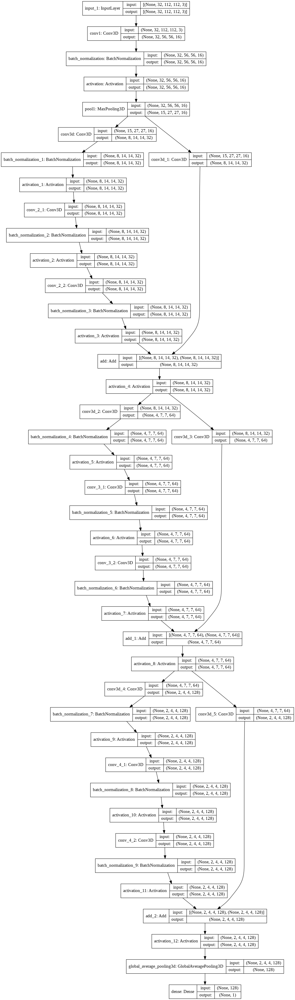

In [ ]:
plot_model(resnet10, show_shapes=True)

### Train Model

In [ ]:
resnet10.compile(
    optimizer=tfa.optimizers.AdamW(learning_rate=0.001, weight_decay=0.001),
    loss = 'binary_crossentropy',
    metrics = ['accuracy'])

In [ ]:
# Create a learning rate scheduler callback.
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_accuracy", factor=0.2, patience=1, verbose = 1
)
# Create an early stopping callback.
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy", patience=3, restore_best_weights=False
)
start = time.time()
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath = f'/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/resnet10_Models/resnet10_bin_{int(time.time() - start)}.h5',
     monitor = 'val_accuracy', verbose = 1, save_weights_only = True, save_best_only = True
)

In [ ]:
num_epochs = 8

train_ds = get_dataset(train_data)
train_ds = train_ds.map(extract_data)
train_ds = train_ds.batch(batch_size)
train_ds = train_ds.prefetch(3)

val_ds = get_dataset(val_data)
val_ds = val_ds.map(extract_data)
val_ds = val_ds.batch(batch_size)
val_ds = val_ds.prefetch(3) 

callbacks = [reduce_lr, early_stopping, model_checkpoint]


In [ ]:
for x, y, z in val_ds:
    print(resnet10(x))
    break

In [ ]:
#resnet10.load_weights('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/MFF_Models/resnet10.h5')

In [ ]:
tf.config.run_functions_eagerly(True)
history = resnet10.fit( 
    train_ds,
    epochs=num_epochs,
    validation_data=val_ds,
    callbacks=callbacks,
    
)

Epoch 1/8
889/889 [==============================] - 4169s 5s/step - loss: 0.2391 - accuracy: 0.9032 - val_loss: 1.0329 - val_accuracy: 0.2598

Epoch 00001: val_accuracy did not improve from 0.53603
Epoch 2/8
889/889 [==============================] - 4153s 5s/step - loss: 0.2380 - accuracy: 0.9019 - val_loss: 4.4965 - val_accuracy: 0.1359

Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.

Epoch 00002: val_accuracy did not improve from 0.53603
Epoch 3/8
889/889 [==============================] - 4163s 5s/step - loss: 0.2115 - accuracy: 0.9196 - val_loss: 0.4815 - val_accuracy: 0.7170

Epoch 00003: val_accuracy improved from 0.53603 to 0.71699, saving model to /content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/resnet10_Models/resnet10_bin_4.4345855712890625e-05.h5
Epoch 4/8
889/889 [==============================] - 4156s 5s/step - loss: 0.2516 - accuracy: 0.9031 - val_loss: 4.3589 - val_accuracy: 0.1359

Epoch 00004: ReduceLROnPlateau red

In [ ]:
resnet10.save('3d-resnet-10-bin')

INFO:tensorflow:Assets written to: 3d-resnet-10-bin/assets


In [ ]:
resnet10.evaluate(val_ds)

In [ ]:
!cp -r '/content/3d-resnet-10-bin' '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/resnet_Models/'

In [ ]:
history

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])


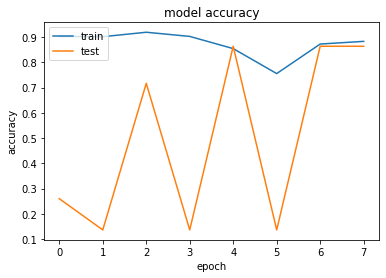

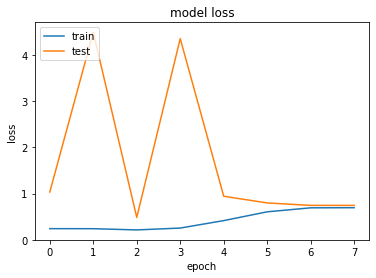

In [ ]:
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Eval

In [ ]:
def show_pred(n = 1):
    n = [n ,n, n, n]
    c1, c2, c3, c4 = 0, 0, 0, 0
    val_ds = get_dataset(val_data)
    val_ds = val_ds.map(extract_data)
    val_ds = val_ds.batch(8)
 
    for data in val_ds:
        pred = resnet10.predict(data[0])
        for i, (x, y, z) in enumerate(zip(data[0], data[1], data[2])):
            label = np.argmax(y)
            if np.argmax(pred[i]) == label:
                c1 += 1
                if label == 0 and n[0] != 0:
                    print('showing correctly predicted....')
                    print(f"No gesture or Doing other things Example number : {n[0]}")
                    print()
                    print()
                    
                    #show_vid(frames = x.numpy().tolist())
                    n[0] -= 1

                elif label == 1 and n[1] != 0: 
                    print('showing correctly predicted....')
                    print(f"Gesture example : {n[1]}")
                    print()
                    print()
                    #show_vid(frames = x.numpy().tolist())
                    
                    n[1] -= 1
            else:
                c2 += 1
                if label == 0 and n[2] != 0:
                    print('showing wrongly predicted....')
                    print(f"No gesture or Doing other things Example : {n[2]}")
                    print()
                    print()
                    #show_vid(frames = x.numpy().tolist())
                    
                    n[2] -= 1

                elif label == 1 and n[3] != 0: 
                    print('showing wrongly predicted....')
                    print(f"Gesture example : {n[3]}")
                    print()
                    print()
                    #show_vid(frames = x.numpy().tolist())
                    
                    n[3] -= 1
        
        if n == [0, 0 ,0 ,0]:
            print(c1)
            print(c2)
            break


In [ ]:
show_pred(10)

showing correctly predicted....
No gesture or Doing other things Example number : 10


showing correctly predicted....
No gesture or Doing other things Example number : 9


showing correctly predicted....
Gesture example : 10


showing correctly predicted....
Gesture example : 9


showing correctly predicted....
Gesture example : 8


showing correctly predicted....
Gesture example : 7


showing wrongly predicted....
Gesture example : 10


showing correctly predicted....
Gesture example : 6


showing correctly predicted....
Gesture example : 5


showing correctly predicted....
Gesture example : 4


showing correctly predicted....
Gesture example : 3


showing correctly predicted....
No gesture or Doing other things Example number : 8


showing wrongly predicted....
Gesture example : 9


showing correctly predicted....
Gesture example : 2


showing correctly predicted....
Gesture example : 1


showing wrongly predicted....
Gesture example : 8


showing wrongly predicted....
Gesture examp

#Finetuning Detector

##Config

In [4]:
data_dir = '/content/20bn-jester-v1'
#data_dir = '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester Data/20bn-jester-v1'
num_frames = 32
resized_shape = (112, 112)
rescale = True
class_weights = {0:1., 1:1.}
detector_name = '3D-resnet-10'
detector_input_shape = (num_frames, resized_shape[0], resized_shape[1], 3)
batch_size = 128

In [5]:
len(os.listdir(data_dir))

148092

## Exploring data

### Reading CSVs

In [6]:
df_train = pd.read_csv('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester CSVs/jester-v1-train.csv', delimiter=';', header=None)
df_test = pd.read_csv('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester CSVs/jester-v1-test.csv', delimiter=';', header=None)
df_val = pd.read_csv('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester CSVs/jester-v1-validation.csv', delimiter=';', header=None)
df_labels = pd.read_csv('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/Jester CSVs/jester-v1-labels.csv', delimiter=';', header=None)

all_classes = []
for i, j in df_labels.iterrows():
    all_classes.append(j.item())

selected_gestures = set(['Swiping Left', 'Swiping Right', 'Swiping Down', 'Swiping Up', 'Stop Sign', 'No gesture', 'Doing other things'])
#selected_gestures = set(['Stop Sign', 'No gesture'])
#selected_gestures = set(all_classes)

train_csv = df_train.to_dict(orient='split')['data']
train_data = {selected_label : [] for selected_label in selected_gestures}
for data in train_csv:
    if data[1] in selected_gestures:
        if data[1] == 'No gesture' or data[1] == 'Doing other things': 
            label = 0.0
        else : label = 1.0
        path = os.path.join(data_dir, str(data[0]))
        train_data[data[1]].append([path, label])

validation_csv = df_val.to_dict(orient='split')['data']
val_data = {selected_label : [] for selected_label in selected_gestures}
for data in validation_csv:
    if data[1] in selected_gestures:
        if data[1] == 'No gesture' or data[1] == 'Doing other things': 
            label = 0.0
        else : label = 1.0
        path = os.path.join(data_dir, str(data[0]))
        val_data[data[1]].append([path, label])

### Extracting Dataset

In [7]:
def find_len(data):
    len_data = 0
    for key in data:
        len_data += len(data[key])
    return len_data
train_total = find_len(train_data)
val_total = find_len(val_data)

In [8]:
neg = len(train_data['No gesture']) + len(train_data['Doing other things'])
pos = train_total - neg
weight_for_0 = (1 / neg)*(train_total)/2.0 
weight_for_1 = (1 / pos)*(train_total)/2.0

In [9]:
train_total, val_total, neg, pos

(34932, 4545, 13870, 21062)

In [10]:
#class_weights = (weight_for_0, weight_for_1)

In [11]:
def show_vid(path = None, frames = None):
    if frames == None:
        path = os.path.join(data_dir, str(path))
        frames = sorted(os.listdir(path))
    for frame in frames:
        if path != None:
            frame = os.path.join(path, frame)
            frame = cv2.imread(frame)
            cv2_imshow(frame)
        else:
            cv2_imshow(np.array(frame) * 255.)

In [12]:
def fn_read_frame(rescale):
    def read_frame(frame):
        frame = cv2.imread(frame)
        frame = cv2.resize(frame, resized_shape)
        if rescale: frame = frame/255.
        return frame
    return read_frame

In [13]:
def fn_read_frame(rescale):
    def read_frame(frame):
        frame = cv2.imread(frame)
        frame = cv2.resize(frame, resized_shape)
        if rescale: frame = frame/255.
        return frame
    return read_frame

In [14]:
f  = ['/content/20bn-jester-v1/69102/00003.jpg', '/content/20bn-jester-v1/69102/00004.jpg', '/content/20bn-jester-v1/69102/00005.jpg', '/content/20bn-jester-v1/69102/00006.jpg', '/content/20bn-jester-v1/69102/00007.jpg', '/content/20bn-jester-v1/69102/00008.jpg', '/content/20bn-jester-v1/69102/00009.jpg', '/content/20bn-jester-v1/69102/00010.jpg', '/content/20bn-jester-v1/69102/00011.jpg', '/content/20bn-jester-v1/69102/00012.jpg', '/content/20bn-jester-v1/69102/00013.jpg', '/content/20bn-jester-v1/69102/00014.jpg', '/content/20bn-jester-v1/69102/00015.jpg', '/content/20bn-jester-v1/69102/00016.jpg', '/content/20bn-jester-v1/69102/00017.jpg', '/content/20bn-jester-v1/69102/00018.jpg', '/content/20bn-jester-v1/69102/00019.jpg', '/content/20bn-jester-v1/69102/00020.jpg', '/content/20bn-jester-v1/69102/00021.jpg', '/content/20bn-jester-v1/69102/00022.jpg', '/content/20bn-jester-v1/69102/00023.jpg', '/content/20bn-jester-v1/69102/00024.jpg', '/content/20bn-jester-v1/69102/00025.jpg', '/content/20bn-jester-v1/69102/00026.jpg', '/content/20bn-jester-v1/69102/00027.jpg', '/content/20bn-jester-v1/69102/00028.jpg', '/content/20bn-jester-v1/69102/00029.jpg', '/content/20bn-jester-v1/69102/00030.jpg', '/content/20bn-jester-v1/69102/00031.jpg', '/content/20bn-jester-v1/69102/00032.jpg', '/content/20bn-jester-v1/69102/00033.jpg', '/content/20bn-jester-v1/69102/00034.jpg']
read_frame = fn_read_frame(rescale)
frames = np.array(list(map(read_frame, f))) 

In [15]:
frames.shape

(32, 112, 112, 3)

In [16]:
def extract_frames(path, label, num_frames = num_frames, resized_shape = resized_shape, rescale = True):
    """
    path, label --> path to video directory with all the frames and its label
    output : num_frames which are resized and rescaled if rescaled == True
    """
    frames = [os.path.join(path, frame) for frame in sorted(os.listdir(path))]
    n_frames = len(frames)

    if n_frames > num_frames:
        odd = n_frames % 2
        remove_n_frames = (n_frames - num_frames) // 2
        frames = frames[remove_n_frames : - (remove_n_frames + odd)]
    
    if n_frames < num_frames:
        odd = n_frames % 2
        add_n_frames = (num_frames - n_frames) // 2
        left_frames = frames[:add_n_frames]
        right_frames = frames[-add_n_frames - odd:]
        frames = left_frames + frames + right_frames

    read_frame = fn_read_frame(rescale)
    frames = np.array(list(map(read_frame, frames)))  
    
    if frames.shape == (0,): 
        print(path)
    
    sample_weight = class_weights[label]

    return (frames, label, sample_weight)

In [17]:
frames, label, sample_weight = extract_frames(val_data['Swiping Up'][1][0], val_data['Swiping Up'][1][1])

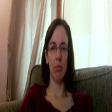

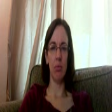

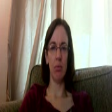

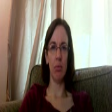

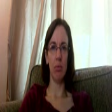

...

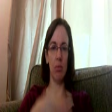

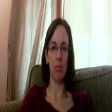

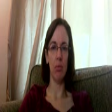

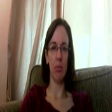

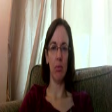

In [18]:
show_vid(frames = frames.tolist())

In [19]:
label, sample_weight

(1.0, 1.0)

### tf.data.Dataset

In [20]:
def get_dataset(data):
    image_paths, labels = [], []
    for key in data:
        for path, label in data[key]:
            image_paths.append(path)
            labels.append(label)
    image_paths, labels = shuffle(image_paths, labels)
    return tf.data.Dataset.from_tensor_slices((image_paths, labels))

In [21]:
def extract_data(path, label):
    def f(path, label):
        #frames, label, weights = extract_frames(path.decode(), label)
        #return (frames, label, weights)
        frames, label, sample_weight = extract_frames(path.decode(), label)
        return (frames, label, sample_weight)
    return tf.numpy_function(f, [path, label], [tf.float64, tf.float32,  tf.float64])

In [22]:
train_ds = get_dataset(train_data)
train_ds = train_ds.map(extract_data).cache()
train_ds = train_ds.batch(batch_size)
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)

In [23]:
val_ds = get_dataset(val_data)
val_ds = val_ds.map(extract_data).cache()
val_ds = val_ds.batch(batch_size)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE) 

In [24]:
i = 0
for x, y, z in train_ds:
    print(x.shape)
    print(y[0])
    print(z.shape)
    print('sample weight for y[0] = ', z[0].numpy())
    break

(128, 32, 112, 112, 3)
tf.Tensor(1.0, shape=(), dtype=float32)
(128,)
sample weight for y[0] =  1.0


## Resnet-10 Model

### Design Model

In [35]:
def conv_block(inputs, F, stage, strides = (2,2,2)):
    base_name = f'conv_{stage}'
    bn_axis = 4

    x = layers.Conv3D(F, (1, 1, 1), strides = strides,
                        kernel_initializer='he_normal')(inputs)
    x = layers.BatchNormalization(axis=bn_axis)(x)
    x = layers.Activation('relu')(x)
    
    x = layers.Conv3D(F, kernel_size=(3, 3, 3), padding = 'same',
                        kernel_initializer = 'he_normal', 
                        name = base_name + '_1')(x)
    x = layers.BatchNormalization(axis=bn_axis)(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv3D(F, kernel_size=(3, 3, 3), padding = 'same',
                        kernel_initializer = 'he_normal', 
                        name = base_name + '_2')(x)
    x = layers.BatchNormalization(axis=bn_axis)(x)
    x = layers.Activation('relu')(x)

    shortcut = layers.Conv3D(F, (1, 1, 1), strides = strides,
                            kernel_initializer='he_normal')(inputs)
                             
    x = layers.add([x, shortcut])
    x = layers.Activation('relu')(x)

    return x
        

def build_model(input_dims, F, model_name):
    input_layer = layers.Input(shape=input_dims)
    x = layers.Conv3D(F, (3,3,7), strides = (1, 2, 2),
                            padding='same',
                            name = 'conv1')(input_layer)
    x = layers.BatchNormalization(axis=4)(x)
    x = layers.Activation('relu')(x)
        
    x = layers.MaxPool3D(pool_size=(3,3,3), strides=(2,2,2), 
                            name = 'pool1')(x)

    #x = conv_block(x, F, stage = 2)
    x = conv_block(x, F * 2, stage = 2)
    x = conv_block(x, F * 4, stage = 3)
    x = conv_block(x, F * 8, stage = 4)

    x = layers.GlobalAveragePooling3D()(x)
    pred = layers.Dense(units = 1, activation='sigmoid')(x)

    return tf.keras.Model(input_layer, pred, name = model_name)


In [36]:
resnet10 = build_model(detector_input_shape, 16, detector_name)

In [37]:
resnet10.summary()

Model: "3D-resnet-10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 32, 112, 112 0                                            
__________________________________________________________________________________________________
conv1 (Conv3D)                  (None, 32, 56, 56, 1 3040        input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_10 (BatchNo (None, 32, 56, 56, 1 64          conv1[0][0]                      
__________________________________________________________________________________________________
activation_13 (Activation)      (None, 32, 56, 56, 1 0           batch_normalization_10[0][0]     
_______________________________________________________________________________________

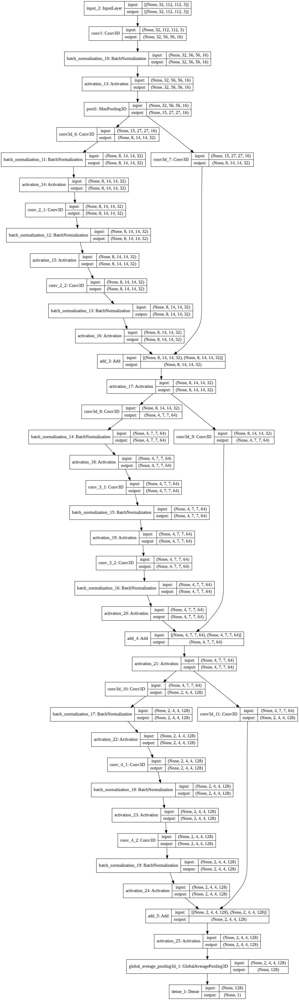

In [38]:
plot_model(resnet10, show_shapes=True)

### Train Model

In [39]:
resnet10.compile(
    optimizer=tfa.optimizers.AdamW(learning_rate=0.0001, weight_decay=0.001),
    loss = 'binary_crossentropy',
    metrics = ['accuracy'])

In [30]:
# Create a learning rate scheduler callback.
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_accuracy", factor=0.2, patience=1, verbose = 1
)
# Create an early stopping callback.
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy", patience=3, restore_best_weights=False
)
start = time.time()
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath = f'/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/resnet10_Models/resnet10_bin_fineTune.h5',
     monitor = 'val_accuracy', verbose = 1, save_weights_only = True, save_best_only = True
)

In [31]:
num_epochs = 10

train_ds = get_dataset(train_data)
train_ds = train_ds.map(extract_data)
train_ds = train_ds.batch(batch_size)
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)

val_ds = get_dataset(val_data)
val_ds = val_ds.map(extract_data)
val_ds = val_ds.batch(batch_size)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE) 

callbacks = [reduce_lr, early_stopping, model_checkpoint]


In [ ]:
for x, y, z in val_ds:
    print(resnet10(x))
    break

In [33]:
#resnet10.load_weights('/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/resnet10_Models/resnet10_bin_4.4345855712890625e-05.h5')

Random Guessing Accuracy = around 57%

In [40]:
tf.config.run_functions_eagerly(True)
history = resnet10.fit( 
    train_ds,
    epochs=num_epochs,
    validation_data=val_ds,
    callbacks=callbacks,
    
)

Epoch 1/10
273/273 [==============================] - 1636s 6s/step - loss: 0.6837 - accuracy: 0.6017 - val_loss: 0.7171 - val_accuracy: 0.4942

Epoch 00001: val_accuracy improved from -inf to 0.49417, saving model to /content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/resnet10_Models/resnet10_bin_fineTune.h5
Epoch 2/10
273/273 [==============================] - 1620s 6s/step - loss: 0.4038 - accuracy: 0.8169 - val_loss: 0.5693 - val_accuracy: 0.6882

Epoch 00002: val_accuracy improved from 0.49417 to 0.68823, saving model to /content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/resnet10_Models/resnet10_bin_fineTune.h5
Epoch 3/10
273/273 [==============================] - 1622s 6s/step - loss: 0.2756 - accuracy: 0.8966 - val_loss: 0.4759 - val_accuracy: 0.8345

Epoch 00003: val_accuracy improved from 0.68823 to 0.83454, saving model to /content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/resnet10_Models/resnet10_bin_fineTune.h5
Epoch 4/10
273/2

In [41]:
resnet10.save('3d-resnet-10-bin-FineTune')

INFO:tensorflow:Assets written to: 3d-resnet-10-bin-FineTune/assets


In [42]:
resnet10.evaluate(val_ds)

36/36 [==============================] - 100s 3s/step - loss: 0.4933 - accuracy: 0.8198


[0.49333035945892334, 0.8198019862174988]

In [43]:
!cp -r '/content/3d-resnet-10-bin-FineTune' '/content/drive/MyDrive/Computer Vision/Dynamic Gesture Recognition/resnet10_Models'

In [44]:
history

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])


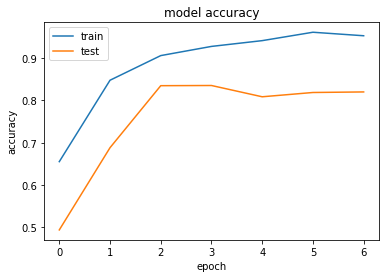

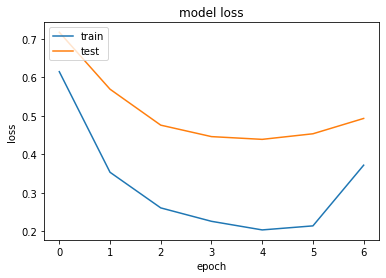

In [45]:
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

### Eval

In [59]:
def show_pred(num_examples_of_each = 1):
    n_pos = [num_examples_of_each for i in range(2)]
    n_neg = n_pos[:]
    val_ds = get_dataset(val_data)
    val_ds = val_ds.map(extract_data)
    val_ds = val_ds.batch(8)

    for data in val_ds:
        pred = resnet10.predict(data[0])
        for i, (x, y) in enumerate(zip(data[0], data[1])):
            
            label = int(y)
            pred_label = int(np.round(pred[i]))
            print(label, pred_label)
            #return x.numpy().tolist(), label_in_words
            if pred_label == label and n_pos[label] > 0:
                print(f'Showing correctly predicted : {label}')
                show_vid(frames = x.numpy().tolist())
                n_pos[label] -= 1
            elif pred_label != label and n_neg[label] > 0:
                print(f'Showing wrongly predicted : {label}')
                print(f'Predicted class : {pred_label}')
                show_vid(frames = x.numpy().tolist())
                n_neg[label] -= 1
        
        if sum(n_neg) + sum(n_pos) == 0:
            break


/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3504: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


1 0
Showing wrongly predicted : 1
Predicted class : 0


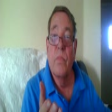

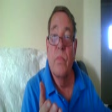

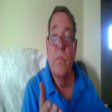

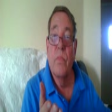

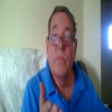

...

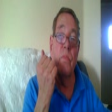

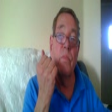

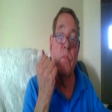

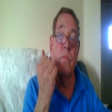

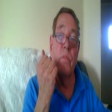

1 1
Showing correctly predicted : 1


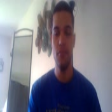

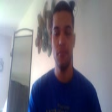

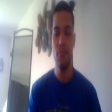

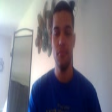

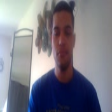

...

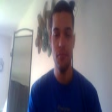

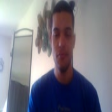

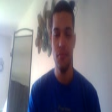

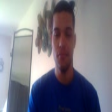

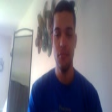

0 0
Showing correctly predicted : 0


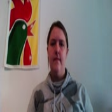

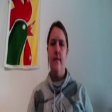

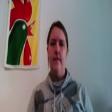

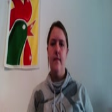

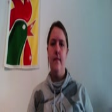

...

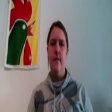

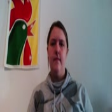

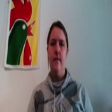

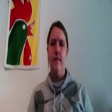

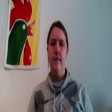

1 1
Showing correctly predicted : 1


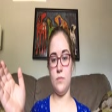

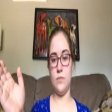

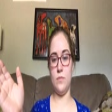

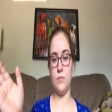

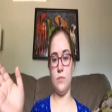

...

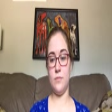

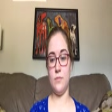

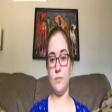

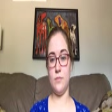

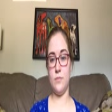

1 1
Showing correctly predicted : 1


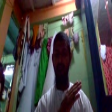

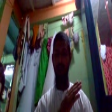

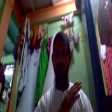

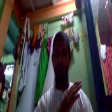

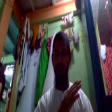

...

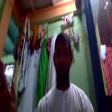

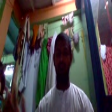

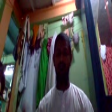

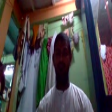

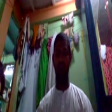

0 0
Showing correctly predicted : 0


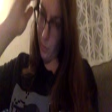

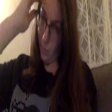

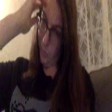

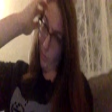

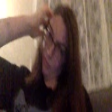

...

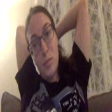

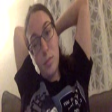

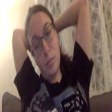

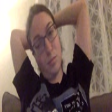

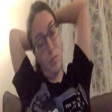

0 0
Showing correctly predicted : 0


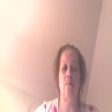

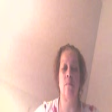

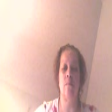

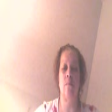

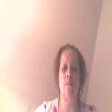

...

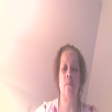

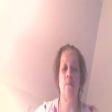

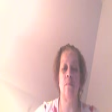

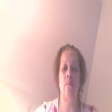

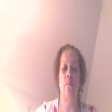

1 1
0 0
1 1
1 1
1 0
Showing wrongly predicted : 1
Predicted class : 0


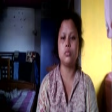

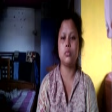

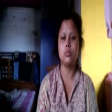

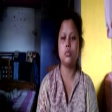

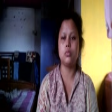

...

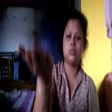

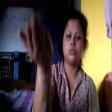

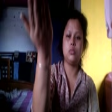

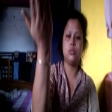

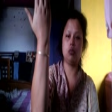

1 1
0 0
0 0
0 0
1 1
0 0
1 1
1 1
1 0
Showing wrongly predicted : 1
Predicted class : 0


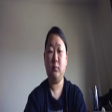

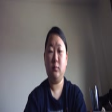

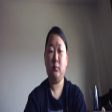

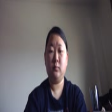

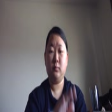

...

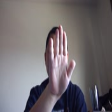

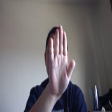

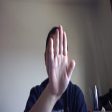

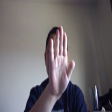

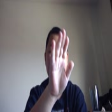

0 1
Showing wrongly predicted : 0
Predicted class : 1


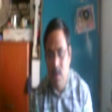

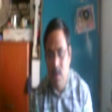

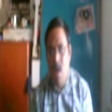

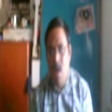

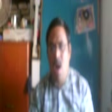

...

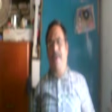

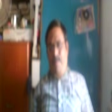

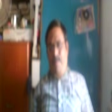

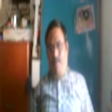

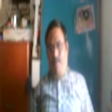

1 0
1 1
1 1
0 0
0 0
1 0
0 0
1 1
0 0
1 1
0 0
1 1
1 1
1 1
0 0
0 0
0 0
1 1
0 0
0 0
0 0
1 1
1 0
0 0
1 0
1 0
1 1
0 0
1 0
1 1
1 1
1 1
1 0
0 0
0 0
1 1
1 1
1 1
1 0
0 0
0 0
0 0
0 0
0 0
1 0
0 0
0 0
1 1
1 1
1 1
1 0
0 0
1 0
1 0
0 0
1 1
0 0
0 0
0 0
1 0
0 0
0 0
1 0
1 1
0 0
1 1
0 0
0 0
0 0
1 1
1 1
0 0
1 1
0 0
1 1
0 0
1 0
1 0
0 0
0 0
0 1
Showing wrongly predicted : 0
Predicted class : 1


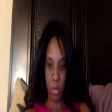

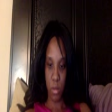

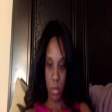

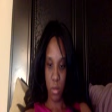

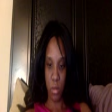

...

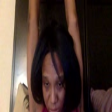

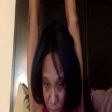

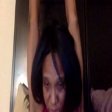

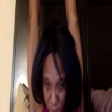

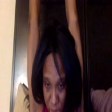

1 0
0 0
1 1
0 0
1 1
1 1
1 0
1 1
1 0
1 0
0 0
1 1
0 0
1 1
1 1
1 1
1 1
0 0
1 0
1 1
0 0
1 1
1 0
0 0
0 0
1 1
0 1
Showing wrongly predicted : 0
Predicted class : 1


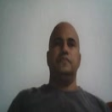

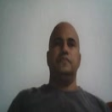

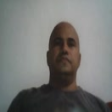

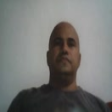

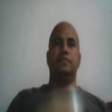

...

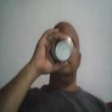

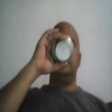

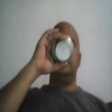

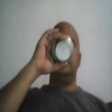

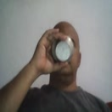

1 1
1 1
1 1
1 0
0 0
1 1


In [62]:
show_pred(3)